## How can we use clusters?
### Use case 1: Grouping
Clustering is often used to group similar instances or to find outliers.
### Use case 2: Classification
Clustering is unsupervised, however each cluster can get its own label/class. If clustering was performed on classed instances, each cluster can be labeled with the prevailing class inside this cluster.

## What to do
* Familiarize yourself with clustering methods. If mentioned methods in this exercise are not enough you can surely find more methods in scikit-learn. You can see that the methods work but you sometimes you don't get "desired" result.
* Try to find the "best" setting (algorithm, descriptors, metrics, linkage) where clusters have the highest [purity](https://en.wikipedia.org/wiki/Cluster_analysis#External_evaluation) (well, don't use the same number of clusters as compounds, try reasonable counts max 50 clusters)
* Try to classify your data e.g. to ligands and non-ligands (work with 20% of your data as you don't know their class, hint. this unknown data should be from both classes). How succesful is your classification? [Confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) could help.

## Jak se používá shlukování?
### Případ použití 1: Grupování
Shlukování se často používá ke seskupení podobných instancí nebo k vyhledání odlehlých hodnot.
### Případ použití 2: Klasifikace
Klastrování je nesupervizované (učení bez učitele - nemáme známou cílovou proměnnou, která by nám řekla, jak to ve skutečnosti vychází, jen odhadujeme), ale každý shluk může získat svůj vlastní štítek/ label / kategorii / třídu. Pokud bylo shlukování provedeno na oklasifikovaných instancích, tak každý shluk může být označen převládající třídou/kategorií uvnitř tohoto shluku.

## Co dělat
* Seznamte se s metodami shlukování. Pokud zmíněné metody v tomto cvičení nestačí, určitě najdete další metody v scikit-learn. Vidíte, že metody fungují, ale někdy nedosáhnete „požadovaného“ výsledku.
* Pokuste se najít „nejlepší“ nastavení (algoritmus, deskriptory, metriky, propojení), kde mají klastry nejvyšší [čistotu](https://en.wikipedia.org/wiki/Cluster_analysis#External_evaluation) (nepoužívejte stejný počet shluků jako sloučeniny, zkuste rozumné počty max. 50 klastrů)
* Zkuste klasifikovat svá data, např. na ligandy a neligandy (pracujte s 20% svých dat, protože neznáte jejich třídu, nápověda. tato neznámá data by měla být z obou tříd). Jak úspěšná je vaše klasifikace? [Confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) by mohl pomoci.

In [1]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot
import seaborn

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

# other packages
import pandas as pd
import csv
import re

You can use precomputed distances, however be careful if it works.

In [2]:
# some pChEMBL values in our file are not valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")

# function for Lipinski's descriptors
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]

In [3]:
raw_df = pd.read_csv('data/cyclooxygenase_1.csv', sep=';') 

# odstraneni dat, ktere nemaji IC50 nebo maji jinou jednotku nez nM,
# tim se odstrani data, ktere nemaji Smiles
df_cox = raw_df[(raw_df['Standard Units'] == 'nM')]

# vytvoreni danych features, ktere budeme pozdeji vyuzivat
df_cox['rdmol'] = df_cox['Smiles'].apply(lambda x: Chem.MolFromSmiles(x))
df_cox['source'] = 'cox1'
df_cox['pChEMBL_value'] = df_cox['pChEMBL Value'].apply(lambda x: float(x) if float_pattern.match(str(x)) else 0)
df_cox['fps'] = df_cox['rdmol'].apply(lambda x:Chem.GetMorganFingerprintAsBitVect(x,2,nBits=1024))

for f in lip_func:
        df_cox[f[0]] = df_cox['rdmol'].apply(lambda x: f[1](x))

df_cox = df_cox[["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)]]
df_cox.head()

/home/simik/.local/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/simik/.local/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/simik/.local/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,TPSA,RB
0,COc1ccc(/C=N/c2ccc(S(N)(=O)=O)cc2)cc1O,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c837b0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.36,5,2,306.067428,1.7988,101.98,4
1,COc1cc(/C=N/c2ccc(S(N)(=O)=O)cc2)ccc1O,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c83850>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.11,5,2,306.067428,1.7988,101.98,4
2,Nc1ccc(C(=O)Nc2ccc(C(F)(F)F)cc2)nc1,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582d58f80>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,3,2,281.077597,2.9349,68.01,2
3,COc1ccc(-c2noc(CC(=O)O)c2-c2ccc(OC)cc2)cc1,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582d58ee0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",8.85,5,1,339.110673,3.6529,81.79,6
4,CS(=O)(=O)c1ccc(C2=C(c3ccccc3)C(=O)OC2)cc1,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582d58e90>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.94,4,0,314.061280,2.5577,60.44,3


In [4]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = [{"rdmol": m,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(m),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(m, 2, nBits=1024),
             **{f[0]: f[1](m) for f in lip_func}
            } for m in Chem.SDMolSupplier("../data/drugbank.sdf") if m
           ]

In [5]:
# let's work with Pandas dataframe        
df = pd.DataFrame((drugbank), columns = ["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
# adds index as normal column
df = df.append(df_cox)
df.reset_index(level=0, inplace=True,drop=True)
df

,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,TPSA,RB
0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fe582d841c0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,29,28,2178.985813,-8.11643,901.57,66
1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fe582d84120>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1268.641439,-3.10570,495.89,31
2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fe5cc34b850>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,15,14,1068.426955,-4.13203,435.41,19
3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fe5cc34b0d0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,16,17,1429.669818,-0.50613,495.67,38
4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fe5cc34b760>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.00,12,5,1201.841368,3.26900,278.80,15
...,...,...,...,...,...,...,...,...,...,...,...
10303,COc1ccc(-n2nc(C(F)(F)F)cc2-c2ccc(Cl)cc2)cc1,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c15990>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",7.28,3,0,352.059025,5.22010,27.05,3
10304,Cc1ccc(-n2nc(COC(=O)COc3cc(O)c4c(=O)cc(-c5cccc...,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c159e0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.30,8,1,592.140114,7.10232,103.79,8
10305,CC(C)(C)C1=NN(c2ccc(C(=O)O)cc2)C(c2ccccc2)C1,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c15a30>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,3,1,322.168128,4.73830,52.90,3
10306,CC(C)(C)C1=NN(c2ccc(S(=O)(=O)O)cc2)C(c2ccc(F)c...,cox1,<rdkit.Chem.rdchem.Mol object at 0x7fe582c15a80>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.00,4,1,376.125692,4.42590,69.97,3


In [9]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

In [10]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [11]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [12]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

In [13]:
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

/home/simik/.local/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


## Hierarchical clustering
[Hierarchical clustering](https://en.wikipedia.org/wiki/Hierarchical_clustering)

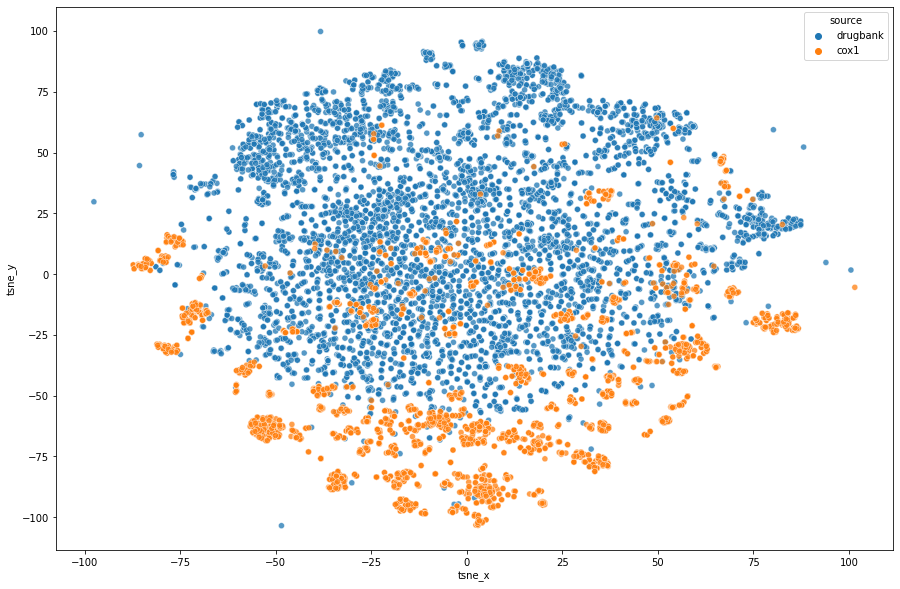

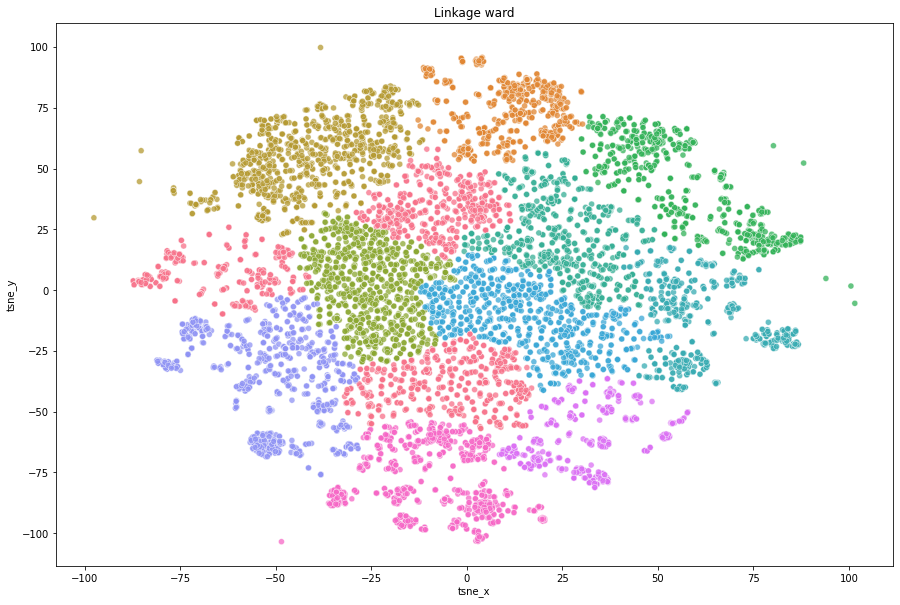

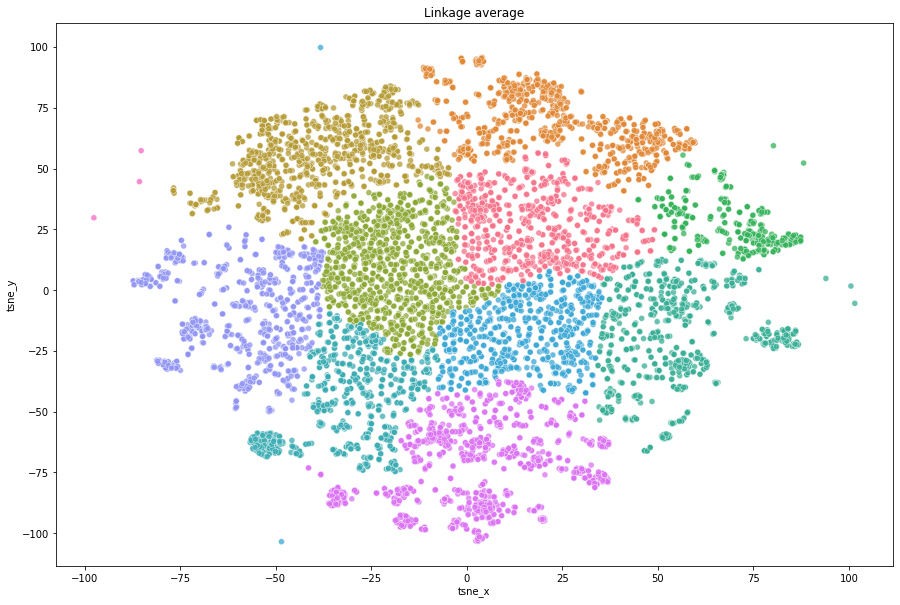

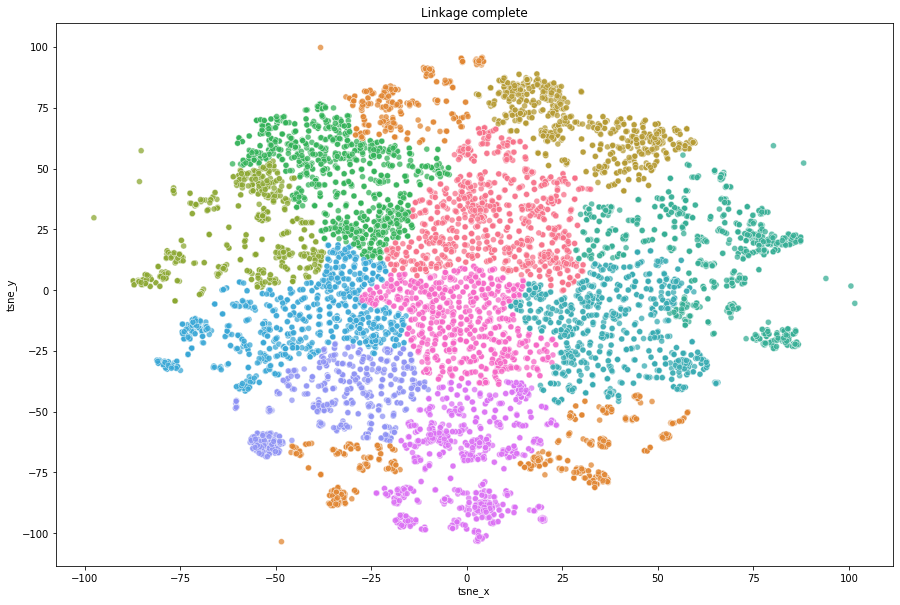

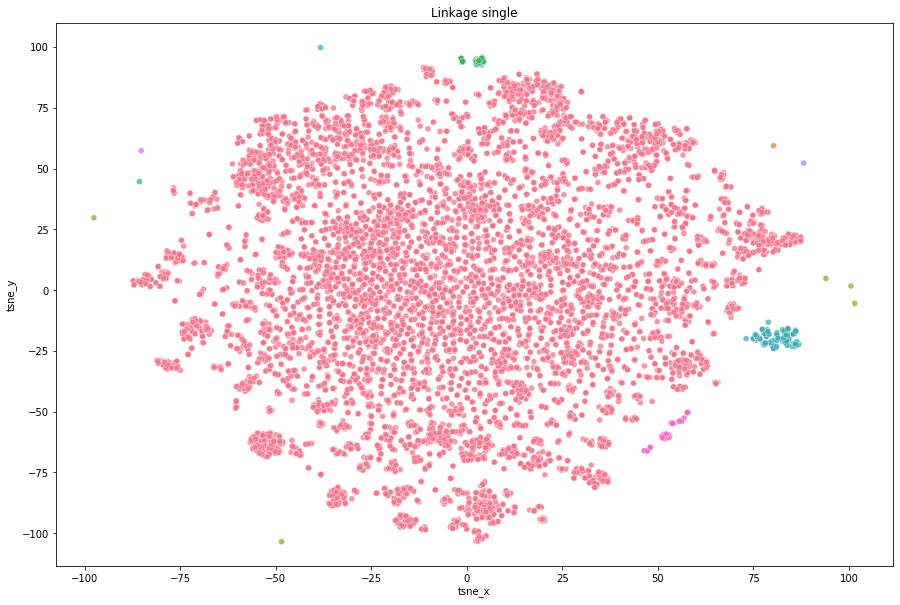

In [22]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=13)
    clustering.fit(df[["tsne_x", "tsne_y"]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")

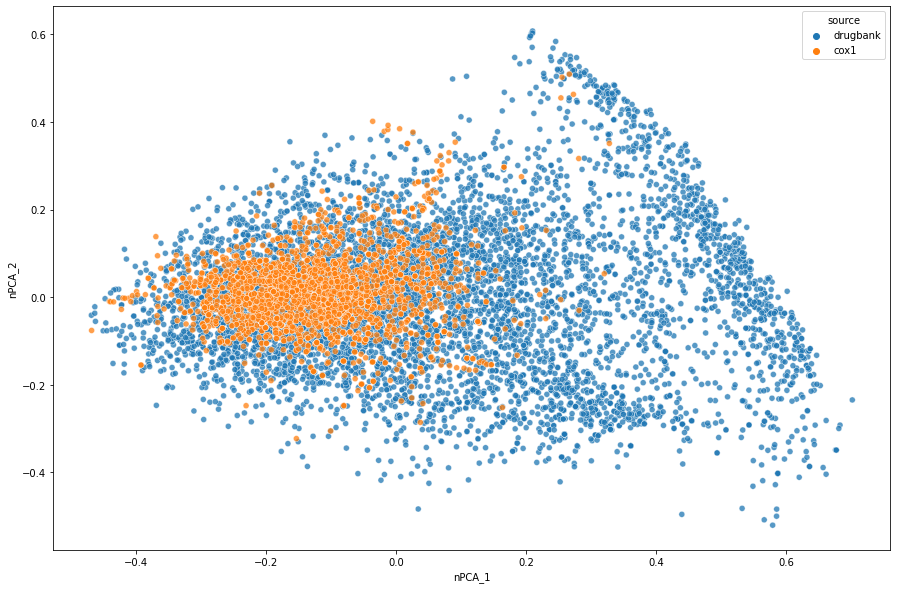

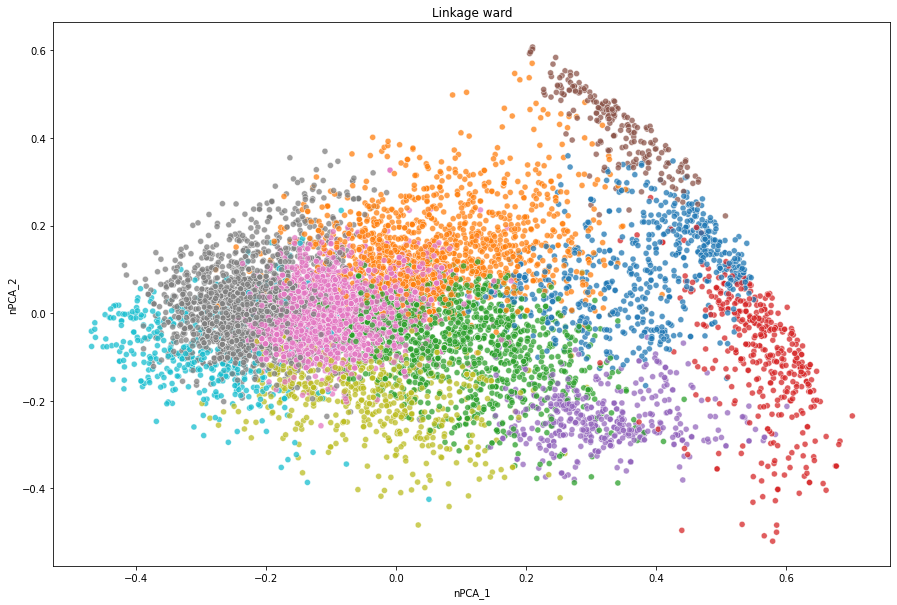

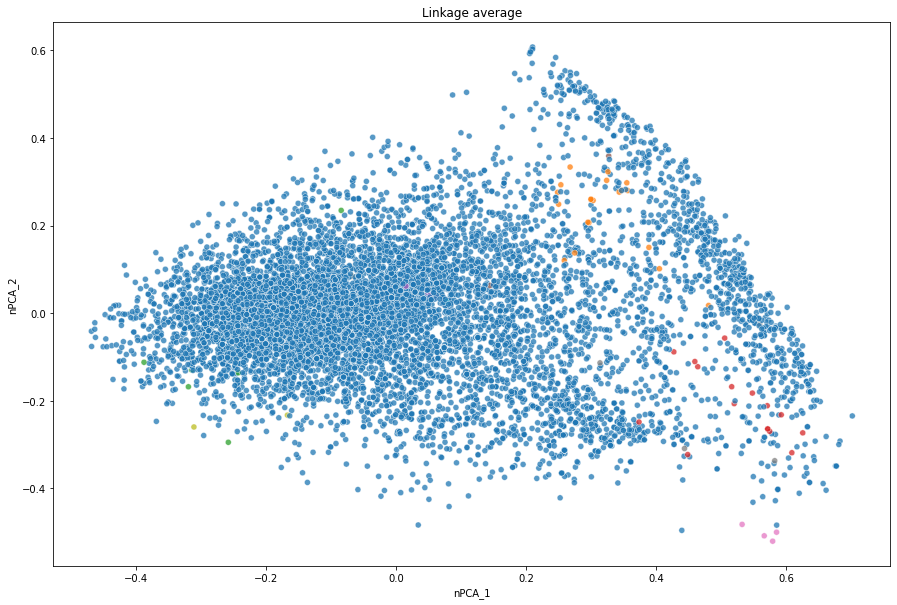

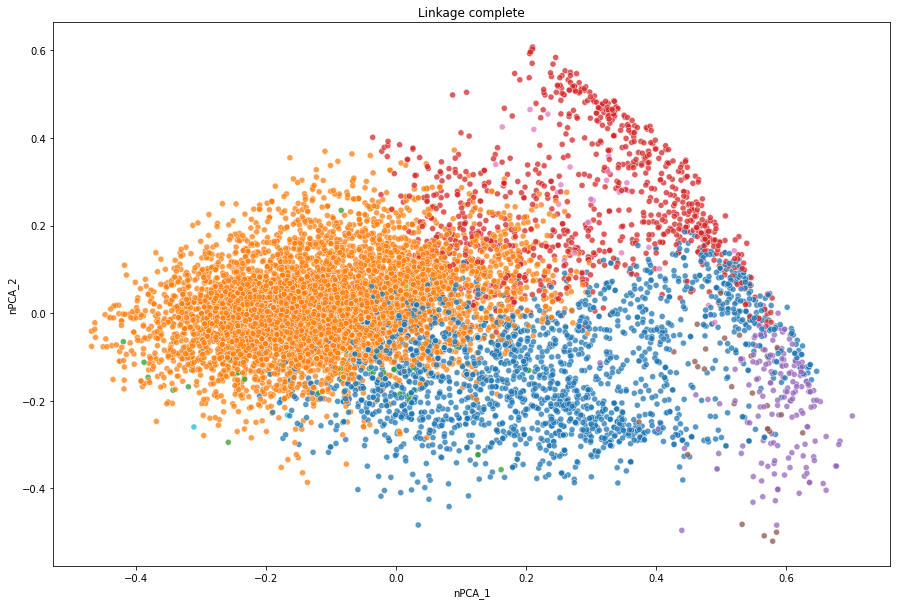

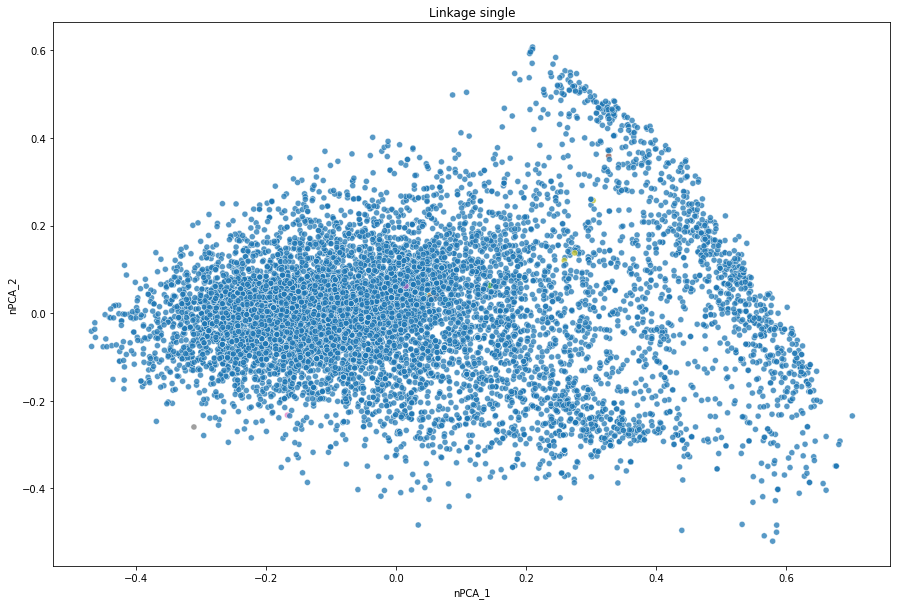

In [24]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

## K-means shlukovací algoritmus
Jedná se o nejjednodušší algoritmus učení bez učitele, který řeší problém se shlukováním. Algoritmus K-means rozděluje n pozorování na k shluků, kde každé pozorování patří ke shluku, přičemž nejbližší průměr slouží jako prototyp shluku.

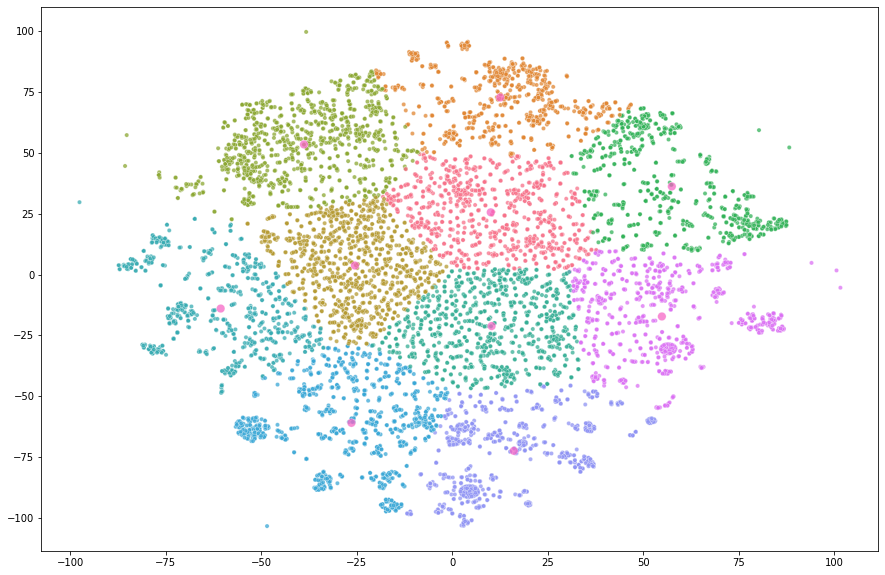

In [25]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



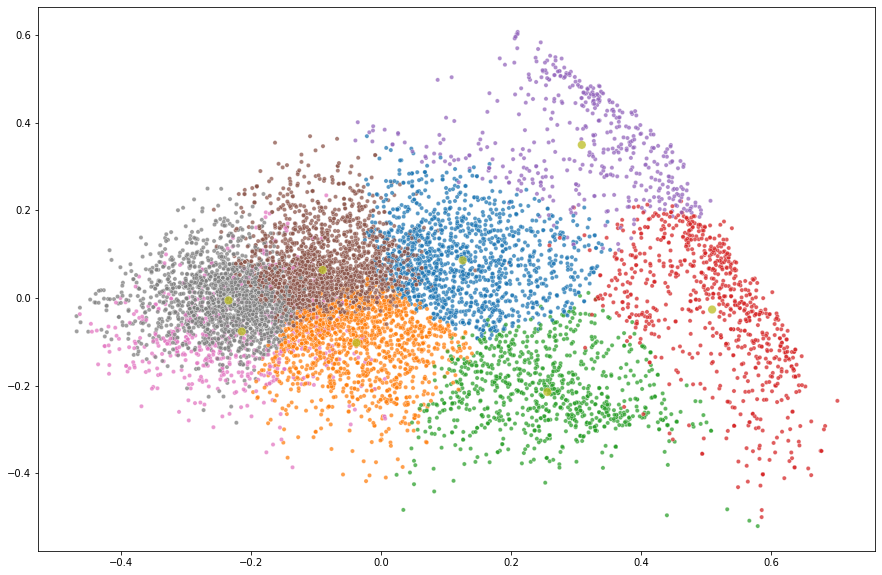

In [28]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 8
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

Můžete použít předpočítané vzdálenosti, ale buďte opatrní, pokud to funguje.

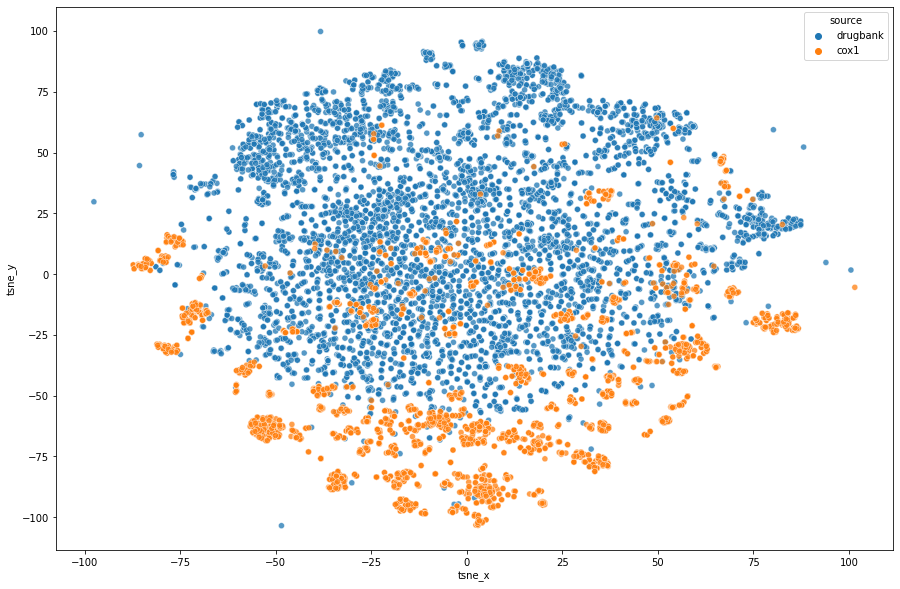

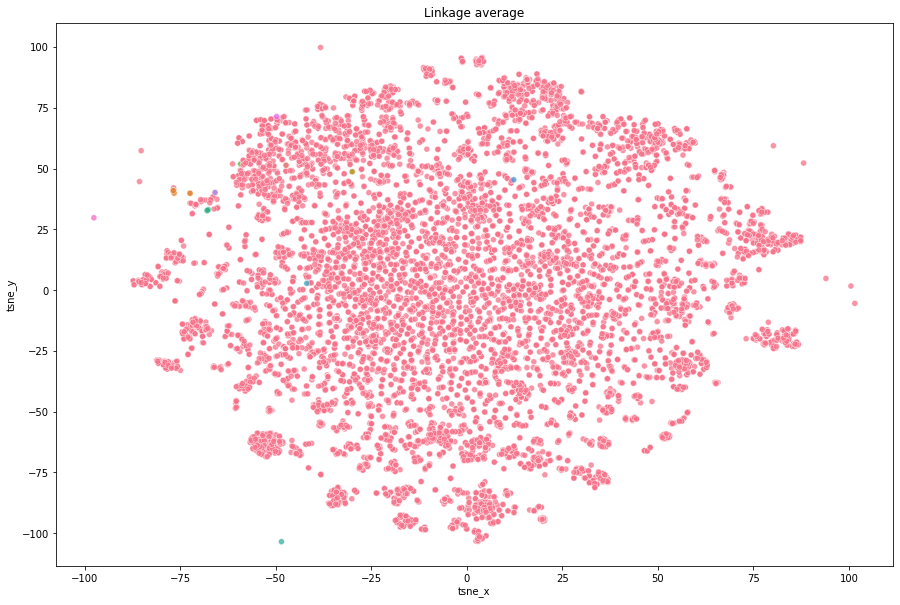

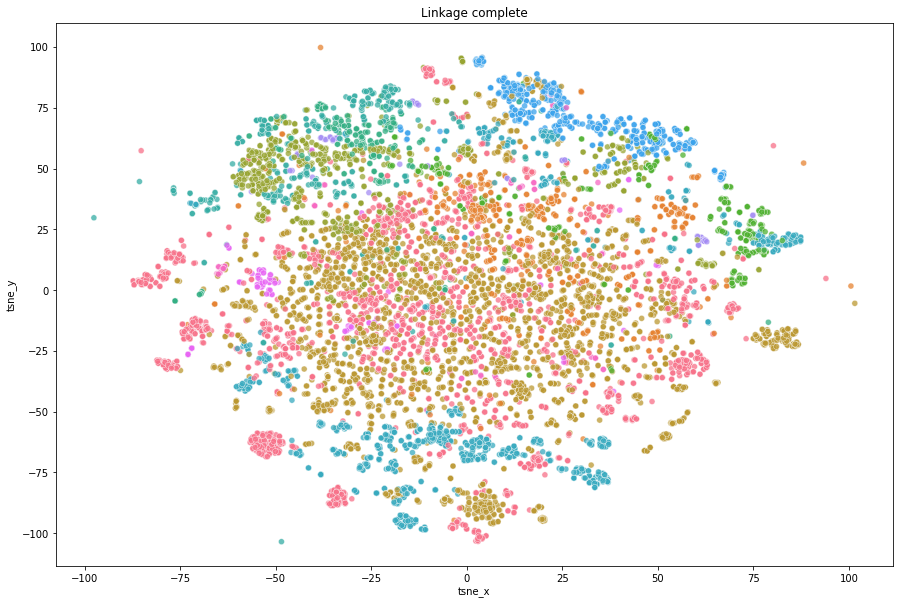

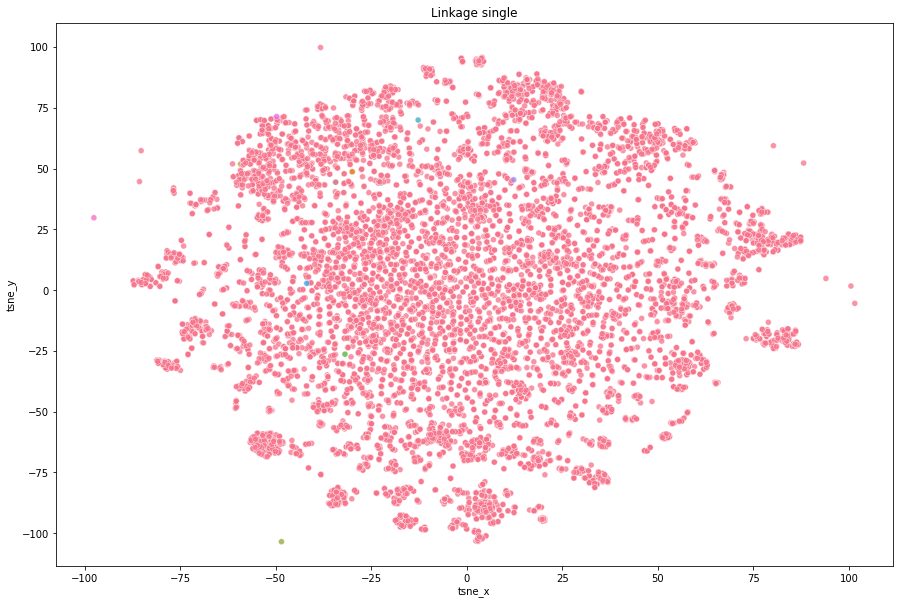

In [32]:
n_clusters = 12
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

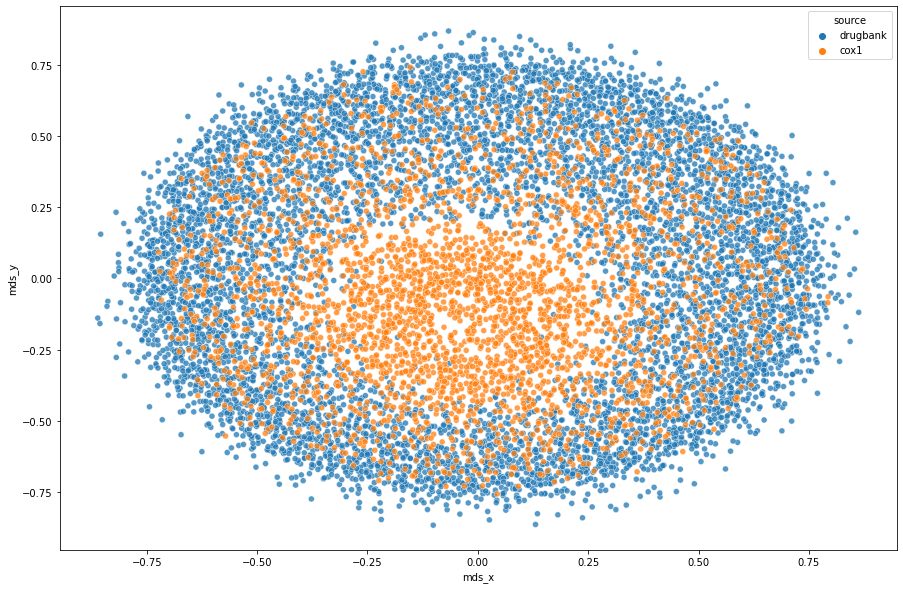

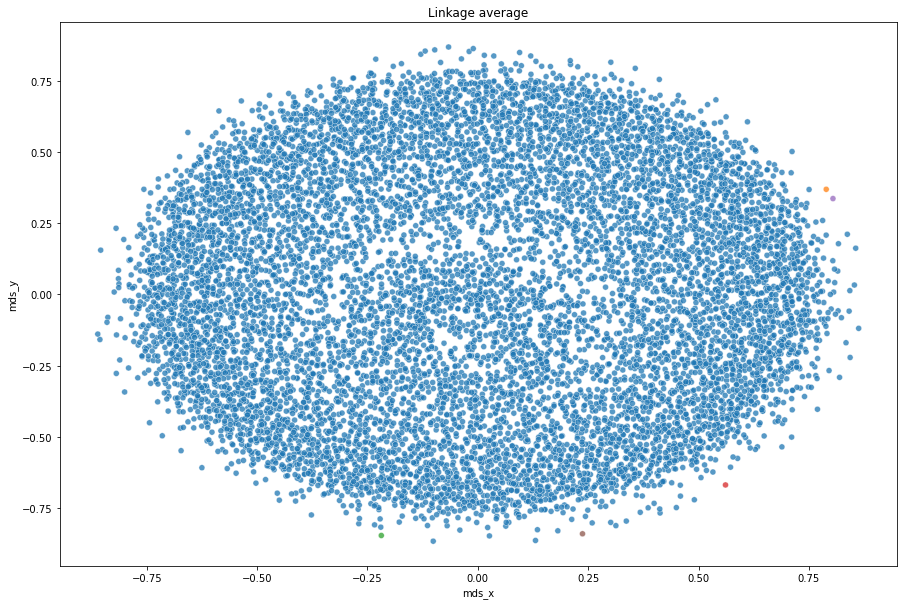

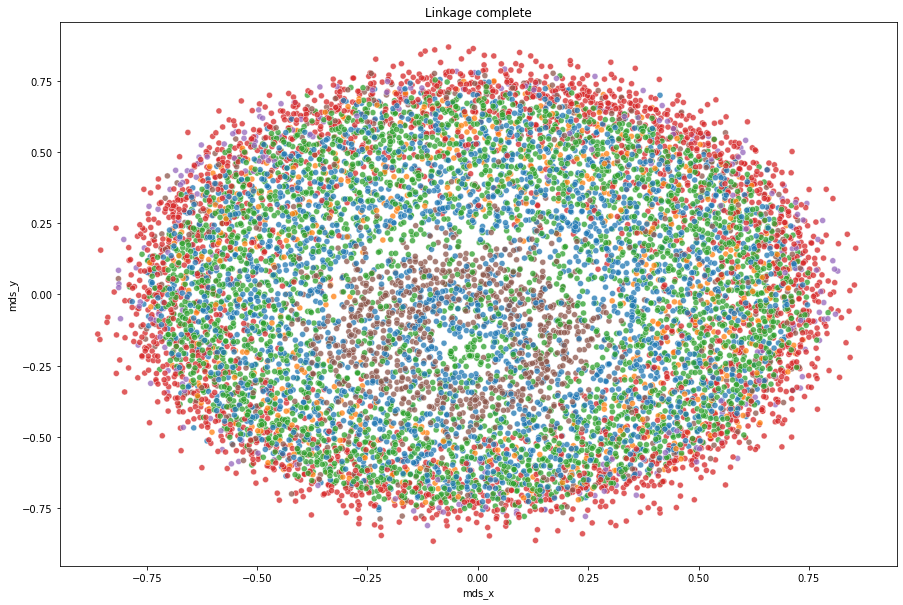

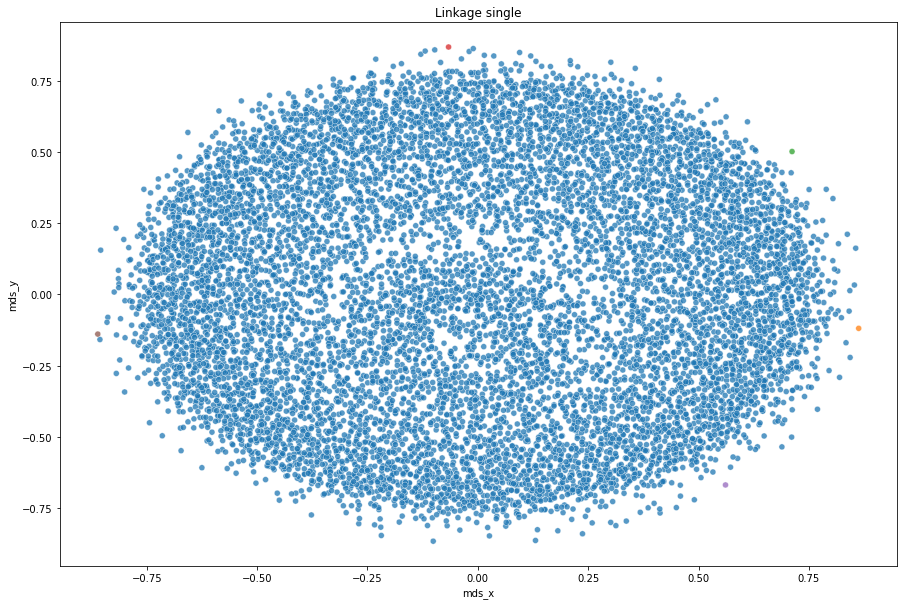

In [36]:
n_clusters = 6
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")